In [ ]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
import scipy.signal as sig
import pywt
import os

/usr/local/lib/python2.7/dist-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [ ]:
d = '../data/recordings'
files = os.listdir(d)
paths = sorted([os.path.join(d, x) for x in files if x.endswith('.wav')])
paths

['../data/recordings/Recording 0001.wav',
 '../data/recordings/Recording 0002.wav',
 '../data/recordings/Recording 0003.wav',
 '../data/recordings/Recording 0018.wav',
 '../data/recordings/Recording 0019.wav',
 '../data/recordings/cal towhee.wav',
 '../data/recordings/chickadee funny noise, other chirp song sparrow.wav',
 '../data/recordings/crow, not phoebe, hummingbird.wav',
 '../data/recordings/hairy woodpecker (2).wav',
 '../data/recordings/noise.wav',
 '../data/recordings/raven, noise.wav',
 '../data/recordings/red tailed hawk, noise.wav',
 '../data/recordings/red tailed hawk.wav',
 '../data/recordings/scrub jay.wav',
 '../data/recordings/unknown sparrow (song?).wav',
 '../data/recordings/various, cal towhee.wav',
 '../data/recordings/various, long.wav',
 '../data/recordings/various, noisy.wav',
 '../data/recordings/various.wav',
 '../data/recordings/white crowned ?.wav',
 '../data/recordings/white crowned sparrow (2).wav',
 '../data/recordings/white crowned, house sparrow, variou

# Wavelet attempts

- Illustration of various wavelets:
  - http://wavelets.pybytes.com/wavelet/dmey/
- Pretty plot of a wavelet transform:
  - https://docs.obspy.org/tutorial/code_snippets/continuous_wavelet_transform.html
- Example of what bird call transformed through wavelets might should look like:
  - https://www.researchgate.net/publication/26620207_Wavelets_in_Recognition_of_Bird_Sounds
- Other informative papers:
  - http://www.ncbi.nlm.nih.gov/pmc/articles/PMC4728069/
  - http://arxiv.org/abs/1311.4764

In [ ]:
# http://pythonhosted.org/PyGASP/
# - https://bitbucket.org/bowmanat/pygasp/src/master/pygasp/dwt.py

path = '../data/recordings/white crowned sparrow (2).wav'

from pygasp.dwt import dwt

# Very slow...
#rate, signal = wav.read(path)
#signal_dwt = dwt.dwt(signal, wav='db3', levels=5, mode='zpd')
#signal_dwt

# Never terminates...
#dwt.scalogram(signal_dwt)

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:39: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


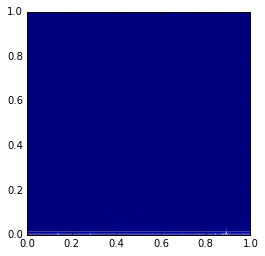

In [ ]:
# http://stackoverflow.com/questions/16482166/basic-plotting-of-wavelet-analysis-output-in-matplotlib
# - Maybe also try https://github.com/nigma/pywt/blob/master/demo/wp_scalogram.py

path = '../data/recordings/white crowned sparrow (2).wav'

def f0():

    import pylab
    import pywt
    import scipy.io.wavfile as wavfile

    # Find the highest power of two less than or equal to the input.
    def lepow2(x):
        return 2 ** pylab.floor(pylab.log2(x))

    # Make a scalogram given an MRA tree.
    def scalogram(data):
        bottom = 0

        vmin = min(map(lambda x: min(abs(x)), data))
        vmax = max(map(lambda x: max(abs(x)), data))

        pylab.gca().set_autoscale_on(False)

        for row in range(0, len(data)):
            scale = 2.0 ** (row - len(data))

            pylab.imshow(
                pylab.array([abs(data[row])]),
                interpolation = 'nearest',
                vmin = vmin,
                vmax = vmax,
                extent = [0, 1, bottom, bottom + scale])

            bottom += scale

    # Load the signal, take the first channel, limit length to a power of 2 for simplicity.
    rate, signal = wavfile.read(path)
    signal = signal[0:lepow2(len(signal))]
    tree = pywt.wavedec(signal, 'db10')

    #pylab.gray()
    scalogram(tree)
    pylab.show()

f0()

In [ ]:
# http://www.pybytes.com/pywavelets/ref/dwt-discrete-wavelet-transform.html
# - http://wavelets.pybytes.com/wavelet/dmey/
cA, cD = pywt.dwt(signal, pywt.Wavelet('db1'))
print cA
print cD
print len(signal), len(cA), len(cD)

# TODO Plot individual wavelets:
# - http://stackoverflow.com/questions/1094655/wavelet-plot-with-python-libraries

[ -38.89087297  201.52543264  224.85995642 ..., -369.10973978 -152.02795796
 -237.58787848]
[ -48.7903679   -27.57716447   12.72792206 ..., -103.23759005   31.81980515
    0.        ]
1011429 505715 505715


../data/recordings/white crowned sparrow (2).wav
(30, 30000)


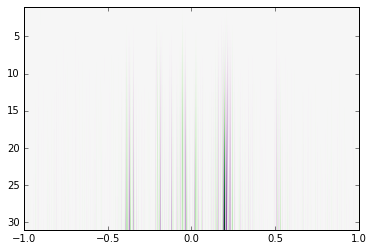

In [ ]:
# http://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.cwt.html
# http://docs.scipy.org/doc/scipy/reference/signal.html


path = '../data/recordings/white crowned sparrow (2).wav'
print path
sample_rate, signal = wav.read(path)

signal = signal[450000:480000]

cwtmatr = sig.cwt(signal, sig.ricker, widths=np.arange(1, 31))
print cwtmatr.shape
plt.imshow(cwtmatr, extent=[-1, 1, 31, 1], cmap='PRGn', aspect='auto', vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
plt.show()

# Spectrogram example

../data/recordings/white crowned sparrow (2).wav


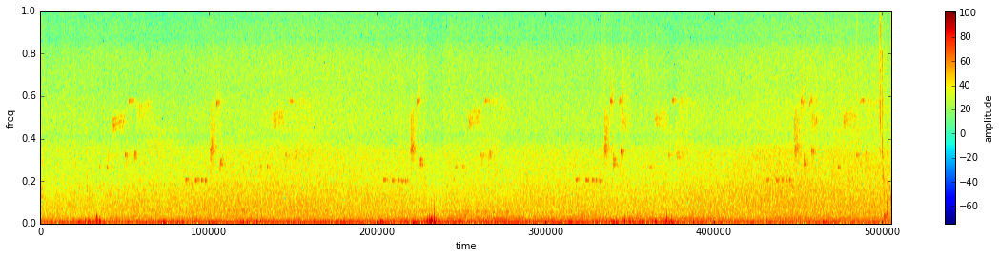

In [ ]:
path = '../data/recordings/white crowned sparrow (2).wav'
#path = '../data/recordings/chickadee funny noise, other chirp song sparrow.wav'
print path
sample_rate, signal = wav.read(path)

signal_len      = 8192
segment_len     = 256
segment_overlap = signal_len/64

# compute and plot spectrogram
plt.figure(figsize = (20, 4))
plt.xlabel('time')
plt.ylabel('freq')
plt.specgram(signal, NFFT=segment_len, noverlap=segment_overlap, sides='onesided')
cb = plt.colorbar()
cb.set_label('amplitude')
plt.autoscale(tight=True)
plt.show()

# All spectrograms

(1/22) ../data/recordings/Recording 0001.wav


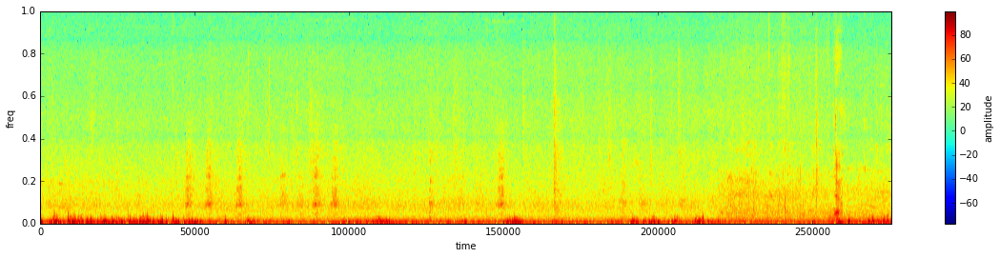

(2/22) ../data/recordings/Recording 0002.wav


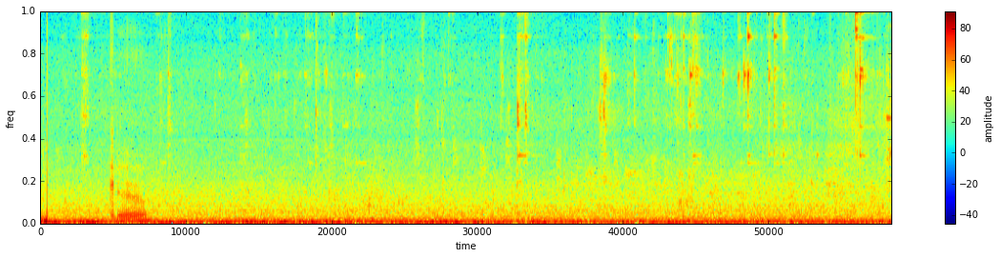

(3/22) ../data/recordings/Recording 0003.wav


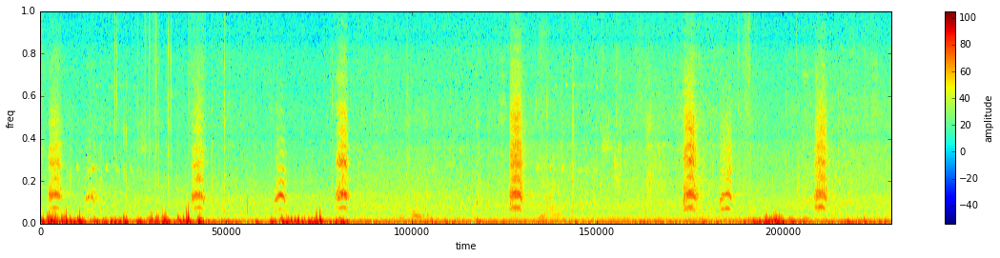

(4/22) ../data/recordings/Recording 0018.wav


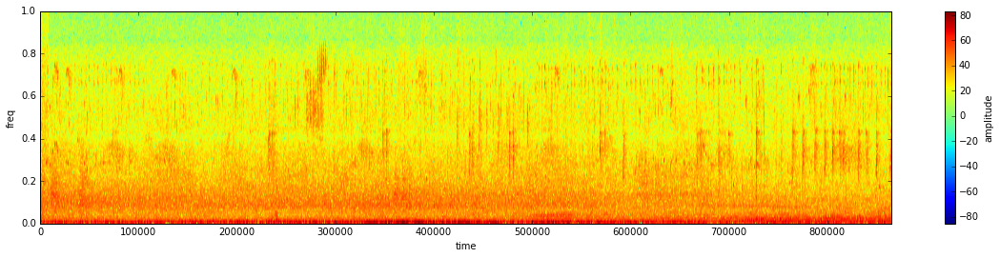

(5/22) ../data/recordings/Recording 0019.wav


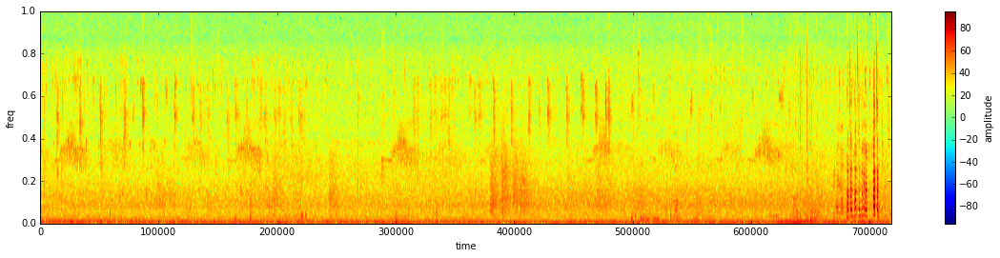

(6/22) ../data/recordings/cal towhee.wav


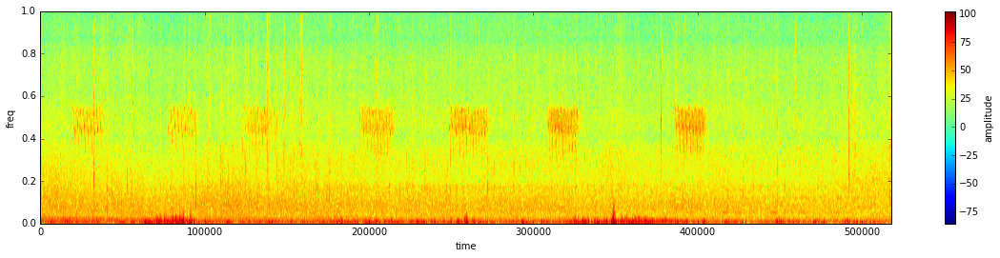

(7/22) ../data/recordings/chickadee funny noise, other chirp song sparrow.wav


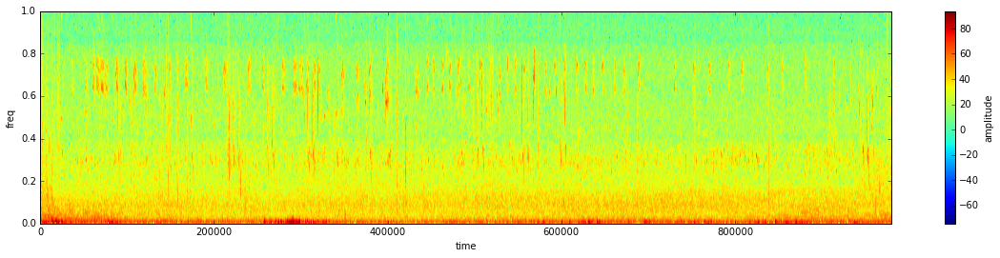

(8/22) ../data/recordings/crow, not phoebe, hummingbird.wav


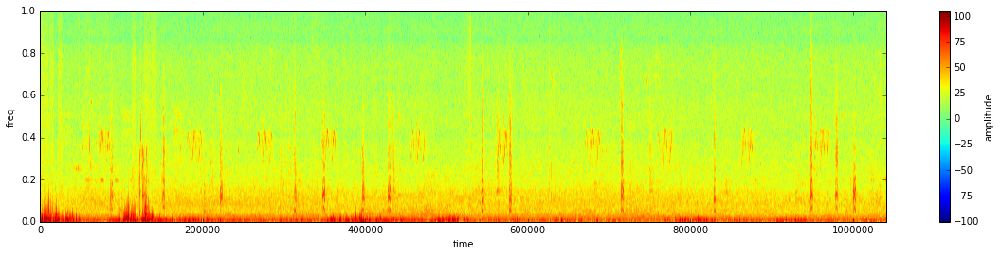

(9/22) ../data/recordings/hairy woodpecker (2).wav


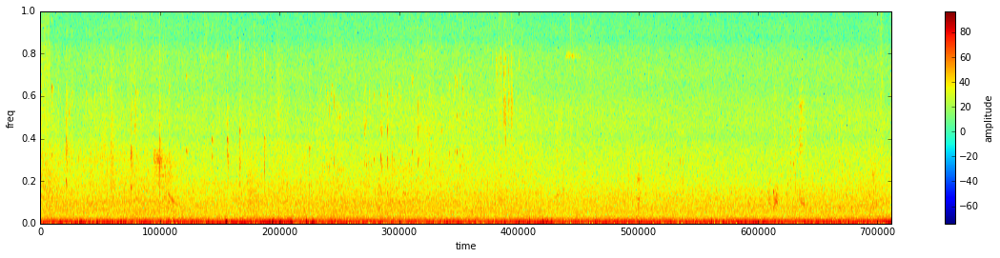

(10/22) ../data/recordings/noise.wav


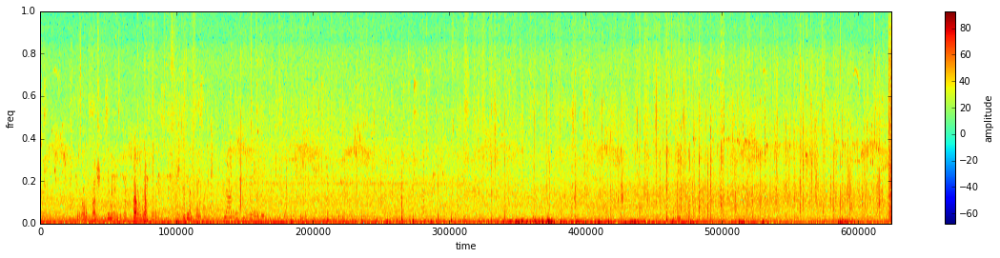

(11/22) ../data/recordings/raven, noise.wav


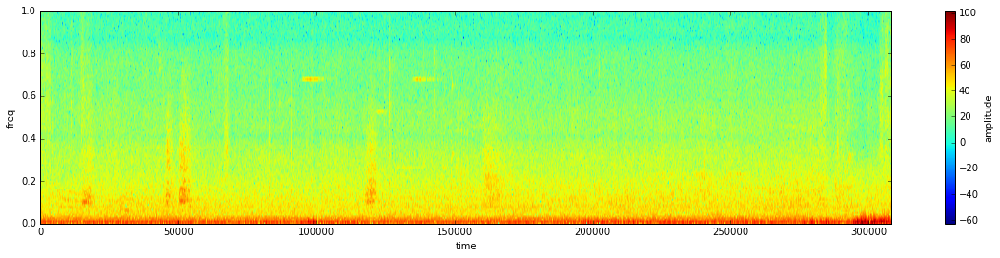

(12/22) ../data/recordings/red tailed hawk, noise.wav


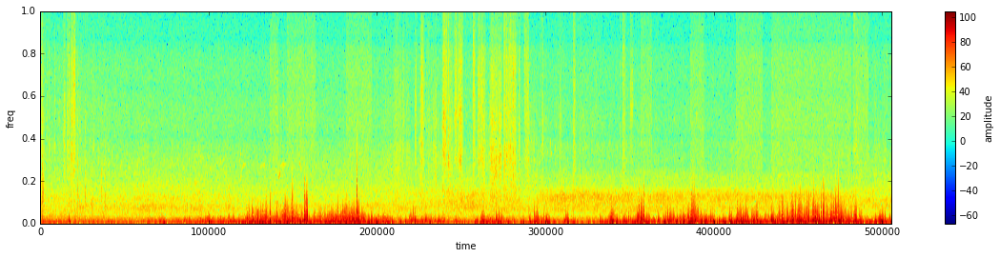

(13/22) ../data/recordings/red tailed hawk.wav


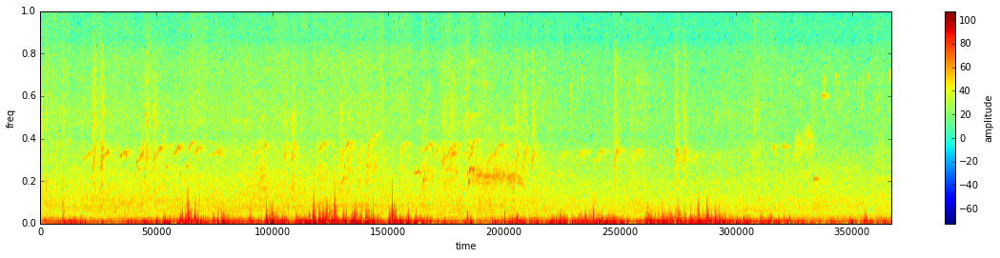

(14/22) ../data/recordings/scrub jay.wav


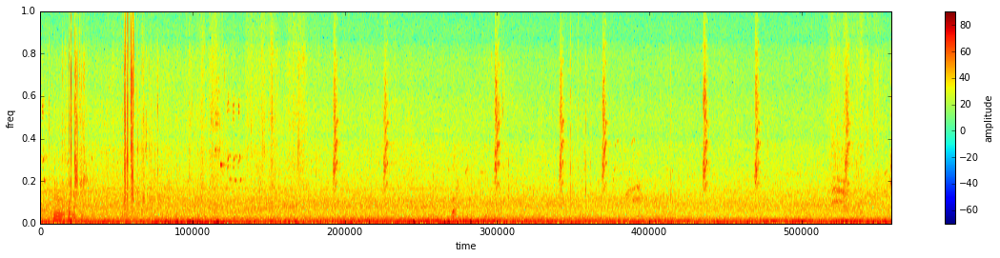

(15/22) ../data/recordings/unknown sparrow (song?).wav


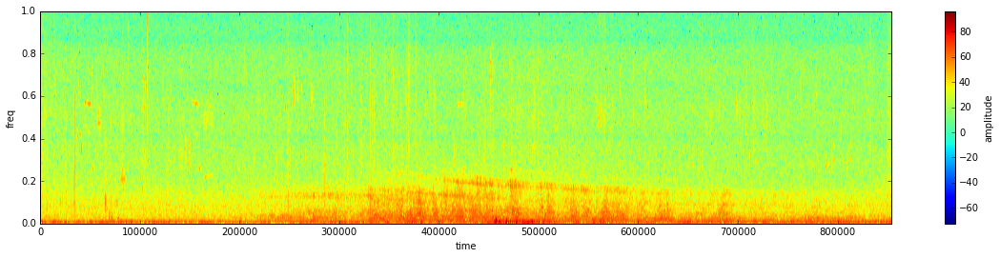

(16/22) ../data/recordings/various, cal towhee.wav


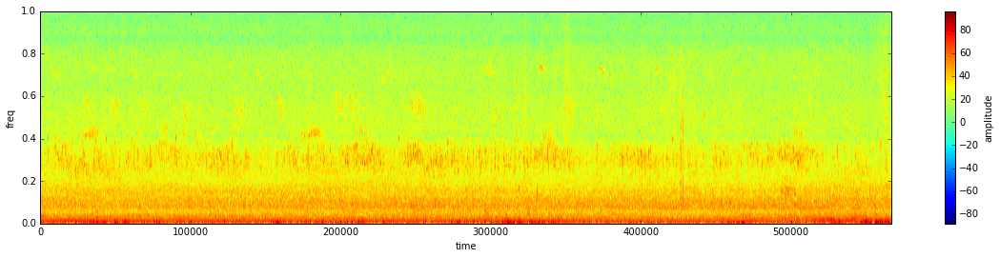

(17/22) ../data/recordings/various, long.wav


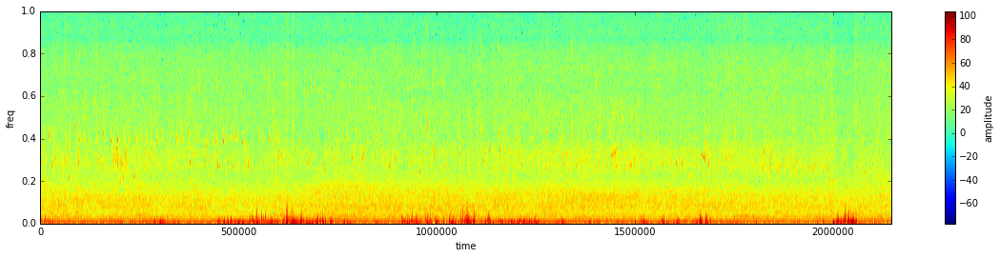

(18/22) ../data/recordings/various, noisy.wav


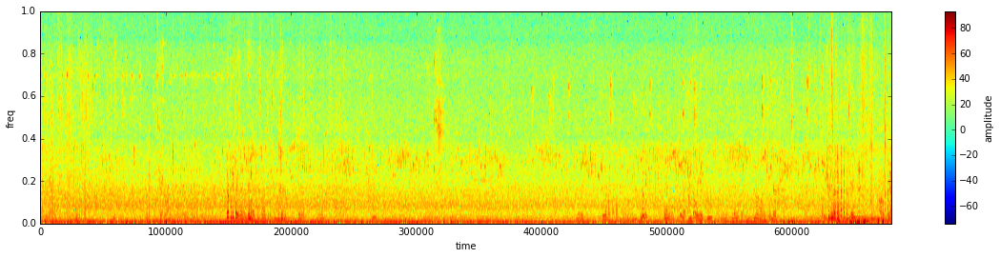

(19/22) ../data/recordings/various.wav


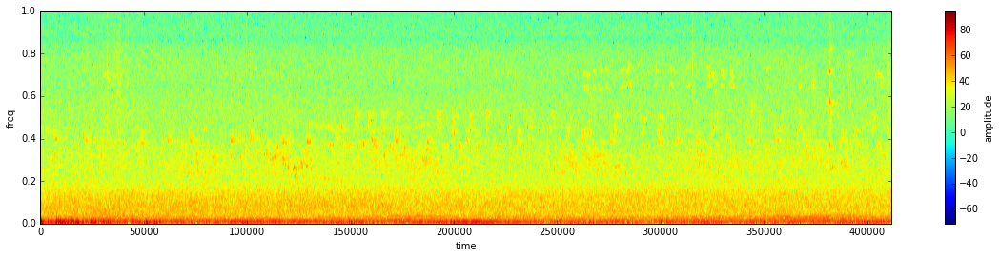

(20/22) ../data/recordings/white crowned ?.wav


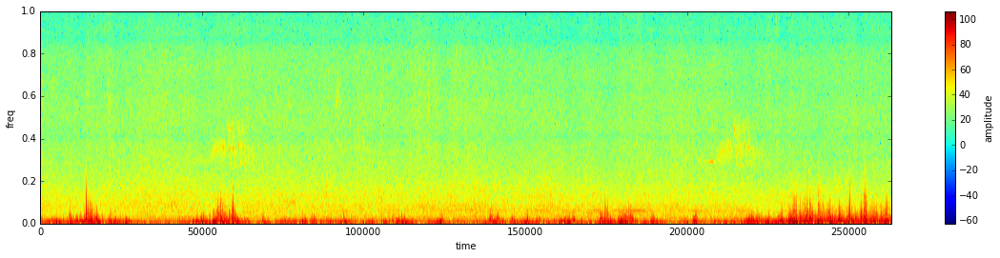

(21/22) ../data/recordings/white crowned sparrow (2).wav


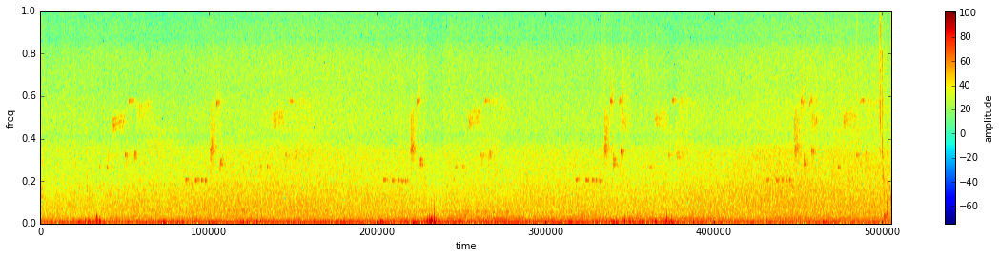

(22/22) ../data/recordings/white crowned, house sparrow, various.wav


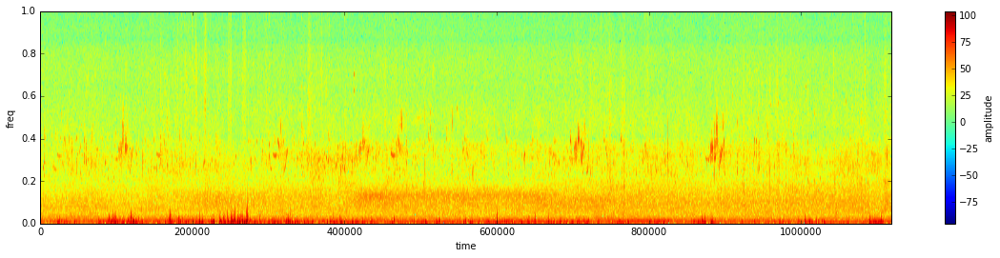

In [ ]:
for i, path in enumerate(paths):

    print '(%s/%s) %s' % (i+1, len(paths), path)
    sample_rate, signal = wav.read(path)

    signal_len      = 8192
    segment_len     = 256
    segment_overlap = signal_len/64

    # compute and plot spectrogram
    plt.figure(figsize = (20, 4))
    plt.xlabel('time')
    plt.ylabel('freq')
    plt.specgram(signal, NFFT=segment_len, noverlap=segment_overlap, sides='onesided')
    cb = plt.colorbar()
    cb.set_label('amplitude')
    plt.autoscale(tight=True)
    plt.show()